<a href="https://colab.research.google.com/github/arabs-in-neuro/intro_to_comp_neuro/blob/main/projects/eeg/Project2_MI_Project_AiN2023_Solutions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Motor Imagery patterns classification Tutorial**

Mohamed H. Zaky

To comprehend how the brain interacts with the limbs, we must find the relation between the imagined movement and the measured brain reaction. Whether the planned action is actual or imagined, the brain will show significant activity in certain brain regions that are highly correlated with movement planning and/or execution.

In this tutorial, we will investigate the activity of specific EEG electrodes that are closely correlated with actual or imagined movement using data gathered during a motor imagery BCI experiment.


**Part0: Call libraries and load data**

In [1]:
# Call needed libraries
import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score

import os
!pip install mne
import mne
import matplotlib.pyplot as plt
from mne import Epochs, pick_types, events_from_annotations
from mne.channels import make_standard_montage
from mne.io import concatenate_raws, read_raw_edf

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 27.7 MB/s eta 0:00:00


In [2]:
# Load the dataset, read data from subject 1, and combine all runs that include right and left hand imaginery movements, in addition to rest
# Exclude S088, S092, S100, since these subjects had damaged recordings, and too little samples (S104) in their left- and right-hand motor imagery datasets
from mne.datasets import eegbci
subject = 1
runs = [4, 8, 12]  # motor imagery: left hand (T1) vs right hand (T2)
raw_fnames = eegbci.load_data(subject, runs)
raw = concatenate_raws([read_raw_edf(f, preload=True) for f in raw_fnames])
eegbci.standardize(raw)  # set channel names
montage = make_standard_montage("standard_1005")
raw.set_montage(montage)

Using default location ~/mne_data for EEGBCI...
Creating ~/mne_data


Do you want to set the path:
    /root/mne_data
as the default EEGBCI dataset path in the mne-python config [y]/n? y
Attempting to create new mne-python configuration file:
/root/.mne/mne-python.json
Download complete in 13s (7.4 MB)
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<RawEDF | S001R04.edf, 64 x 60000 (375.0 s), ~29.4 MB, data loaded>

Using matplotlib as 2D backend.


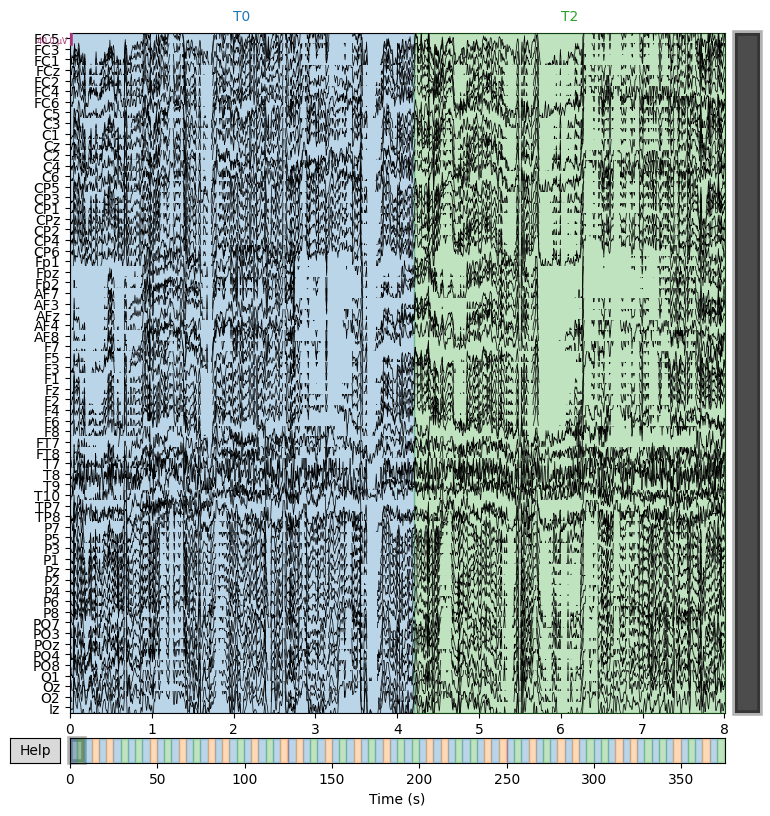

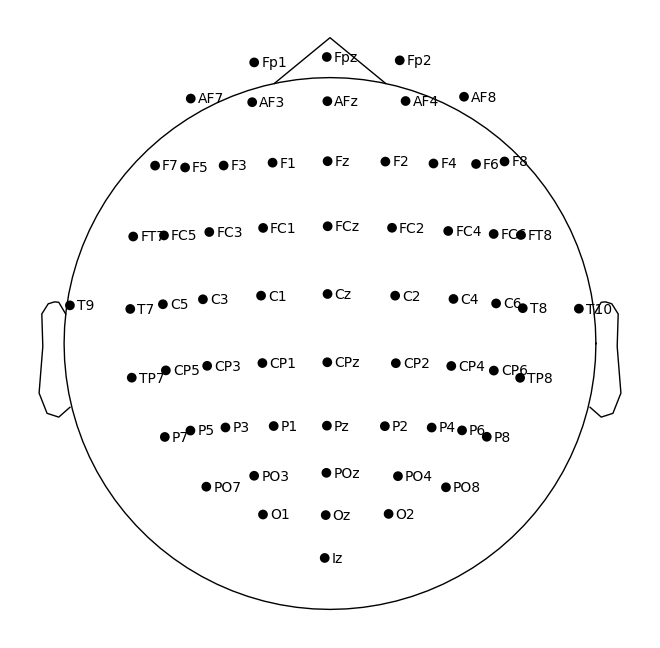

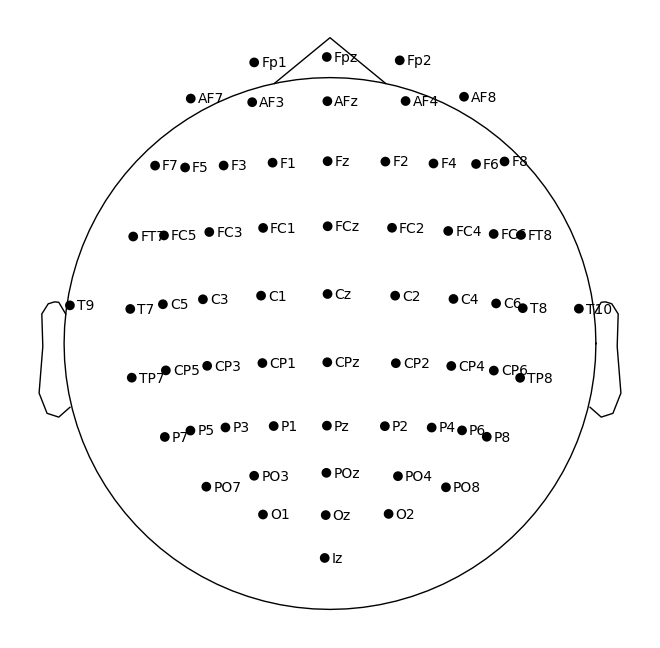

In [3]:
# Plot data and channel locations
raw.plot(duration=8, n_channels=64)
raw.plot_sensors(show_names=True)

**The preprocessing part was already done when the data were recorded** 😄

**You are ready to go! **

**Part 1: Use a band-pass filter to choose the EEG band of interest**

Filtering raw data in 3 contiguous segments
Setting up band-pass filter from 8 - 12 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 12.00 Hz
- Upper transition bandwidth: 3.00 Hz (-6 dB cutoff frequency: 13.50 Hz)
- Filter length: 265 samples (1.656 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


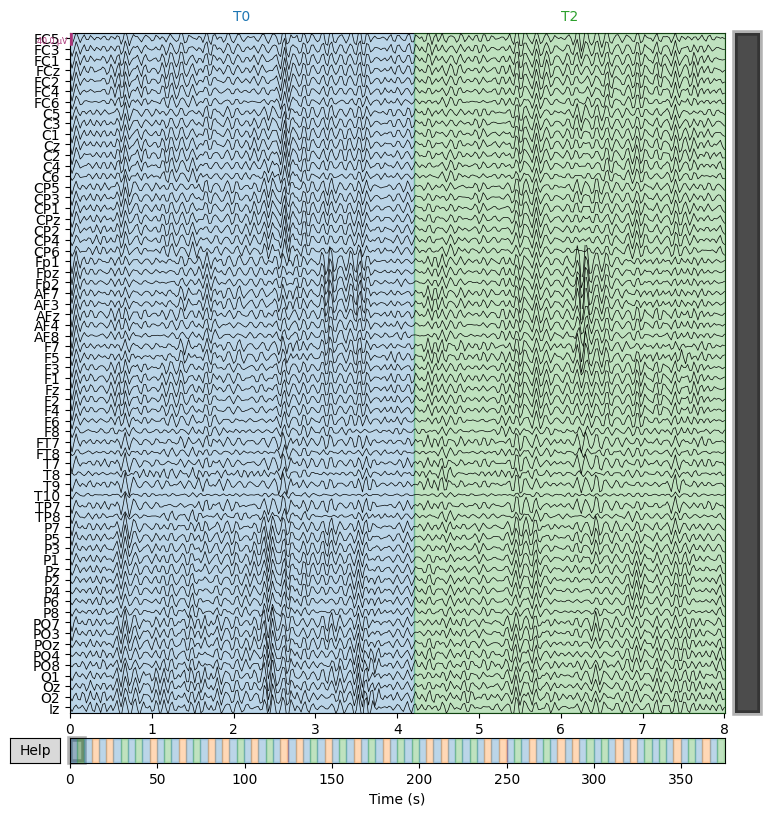

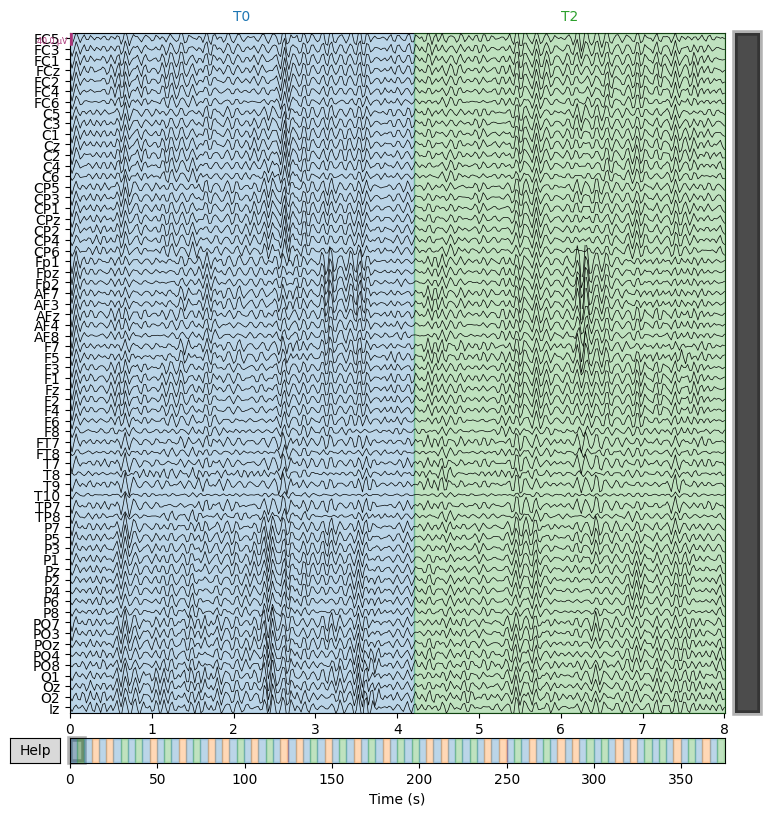

In [4]:
# Apply band-pass filter
# Frequency range chosen will be mu band (8-12 Hz)
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
raw.filter(8, 12, fir_design="firwin", skip_by_annotation="edge")
raw.plot(duration=8, n_channels=64)

**Part2: Create and separate epochs**

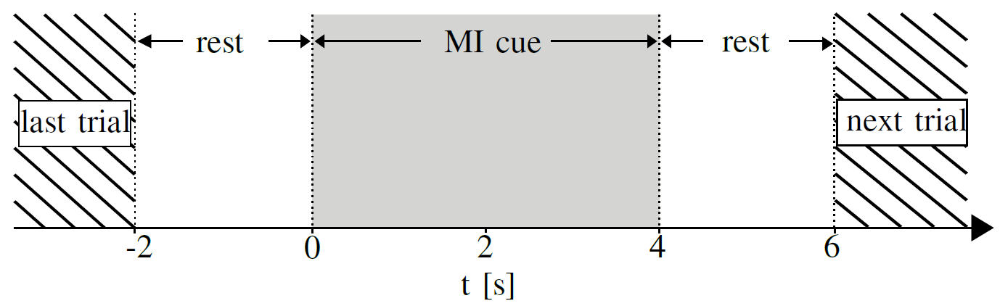

In [5]:
# Read epochs
event_id = dict(left_hand=2, right_hand=3)
events, _ = events_from_annotations(raw, event_id=dict(T1=2,  T2=3))
picks = pick_types(raw.info, meg=False, eeg=True, stim=False, eog=False, exclude="bads")
tmin, tmax = -2, 6
epochs = Epochs(raw, events, event_id, tmin, tmax, proj=False, picks=picks, baseline=(-2,-1), preload=True)

Used Annotations descriptions: ['T1', 'T2']
Not setting metadata
45 matching events found
Applying baseline correction (mode: mean)
Using data from preloaded Raw for 45 events and 1281 original time points ...
3 bad epochs dropped


Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated


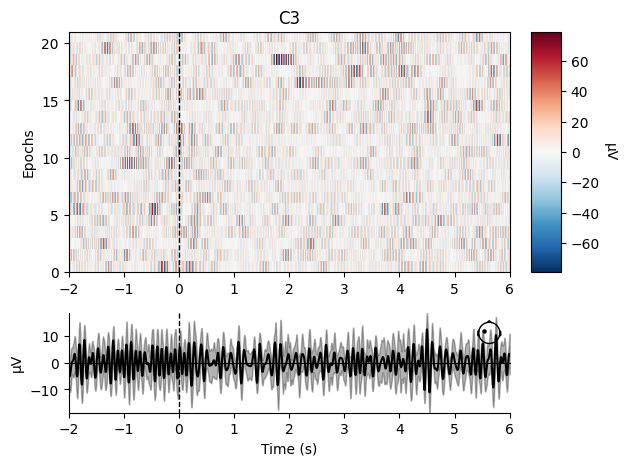

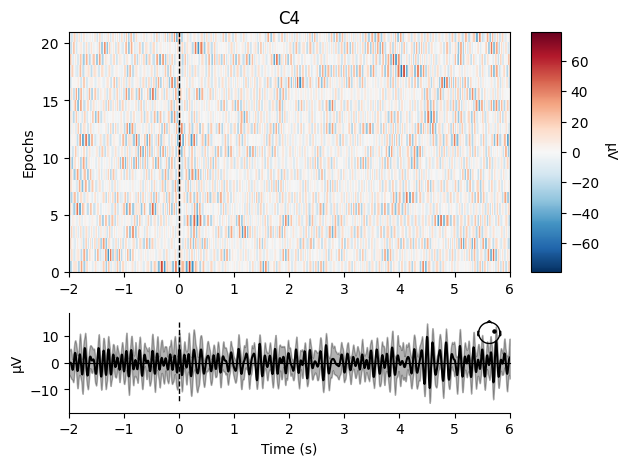

Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated


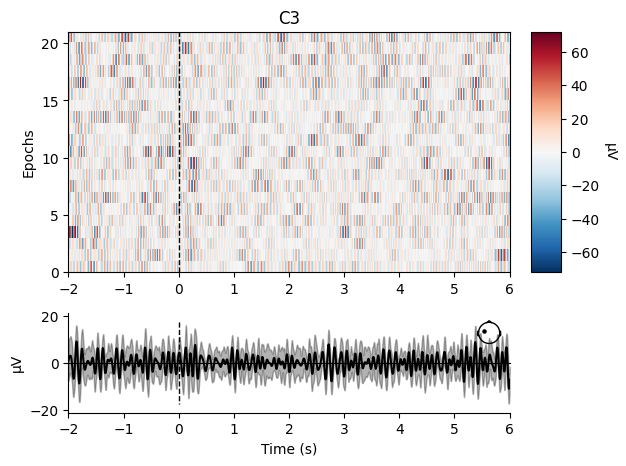

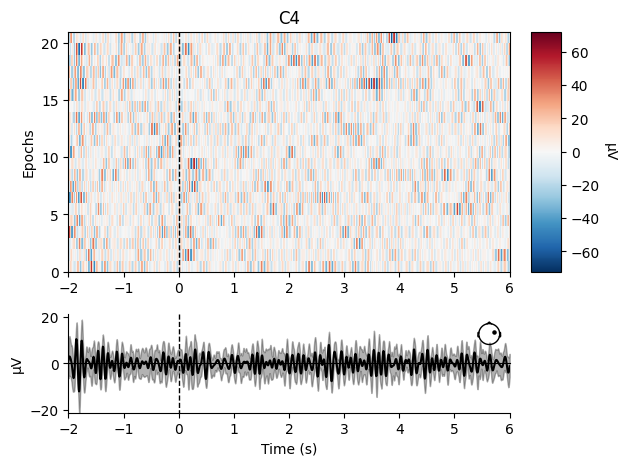

[<Figure size 640x480 with 4 Axes>, <Figure size 640x480 with 4 Axes>]

In [6]:
# Epochs separation
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
Left_hand_epochs = epochs['left_hand']
Left_hand_epochs.plot_image(picks=["C3", "C4"])
Right_hand_epochs = epochs['right_hand']
Right_hand_epochs.plot_image(picks=["C3", "C4"])

**Part3: Calculating and ploting the averaging evoked responses in time domain**

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "gfp"
combining channels using "gfp"


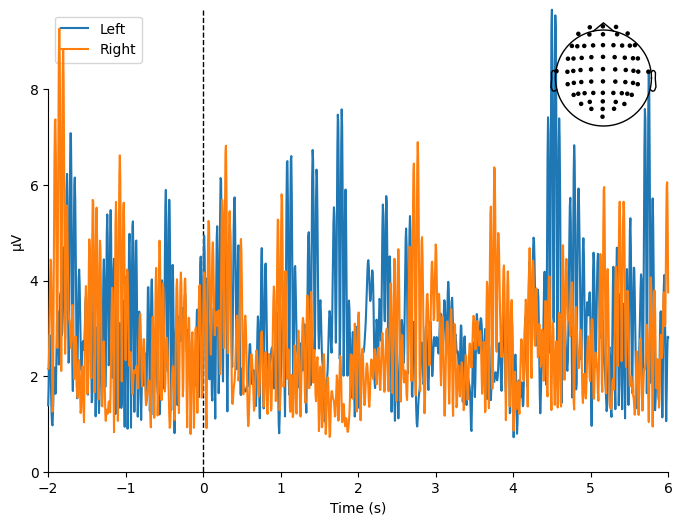

[<Figure size 800x600 with 2 Axes>]

In [7]:
# Averaging evoked responses
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
Left_hand_epochs_evoked = Left_hand_epochs.average()
Right_hand_epochs_evoked = Right_hand_epochs.average()
mne.viz.plot_compare_evokeds(dict(Left=Left_hand_epochs_evoked, Right=Right_hand_epochs_evoked), legend="upper left", show_sensors="upper right")

**Part4: Calculating and ploting the averaging evoked responses in frequency domain**

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows


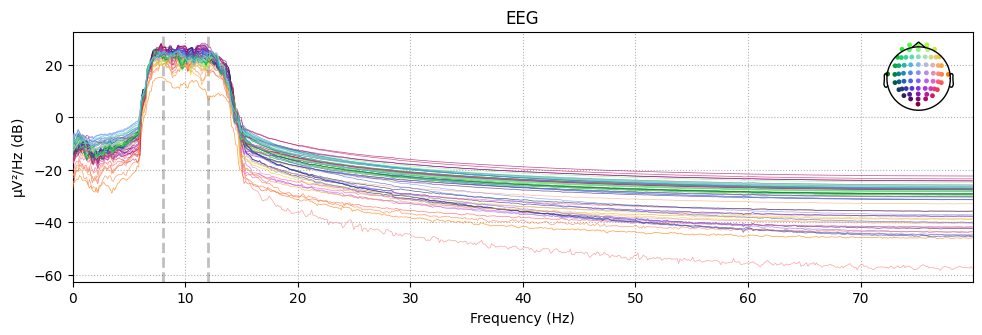

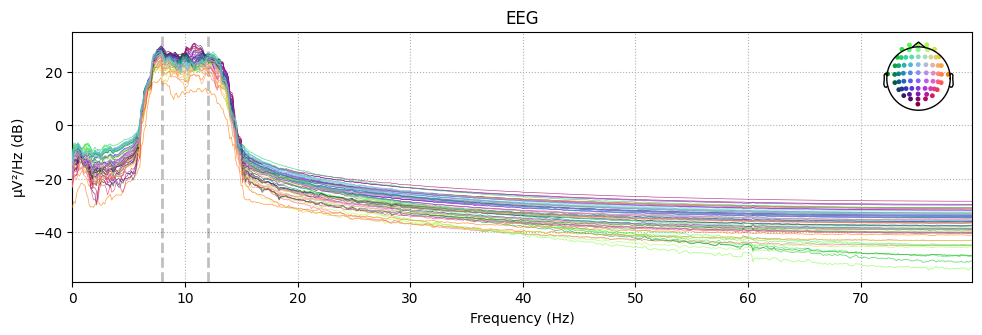

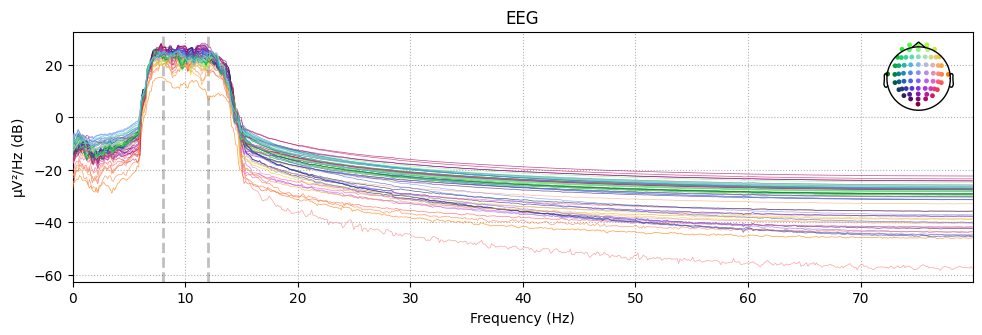

In [8]:
# Visualizing Spectrum objects
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
Left_hand_epochs_evoked_spectrum = Left_hand_epochs_evoked.compute_psd()
Left_hand_epochs_evoked_spectrum.plot()
Right_hand_epochs_evoked_spectrum = Right_hand_epochs_evoked.compute_psd()
Right_hand_epochs_evoked_spectrum.plot()

**Part5: Calculating and ploting the time-frequency response of the averaged evoked responses**

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


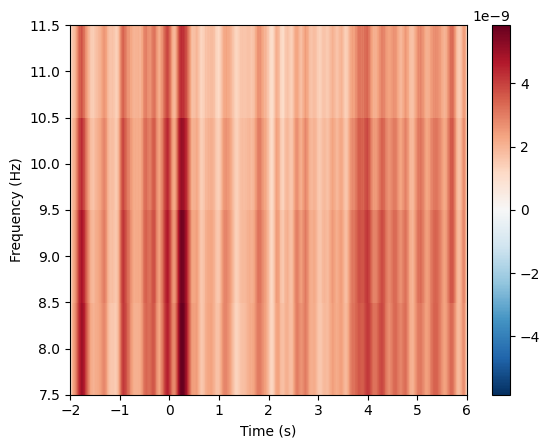

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


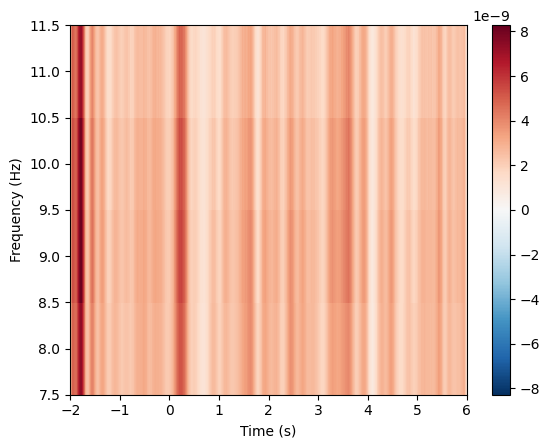

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


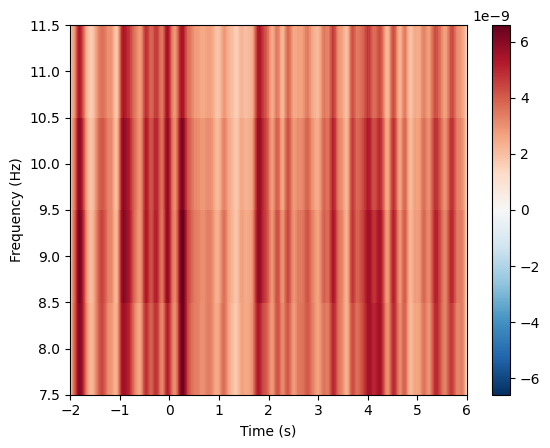

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


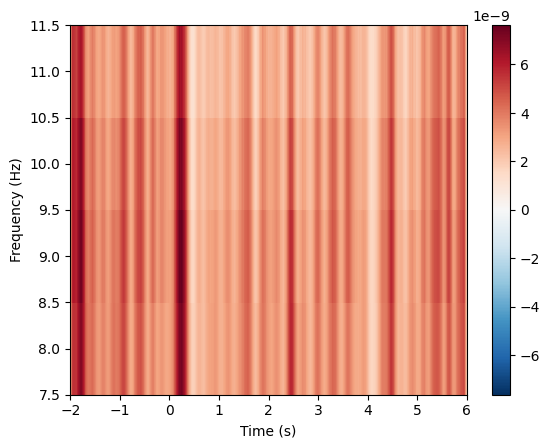

[<Figure size 640x480 with 2 Axes>]

In [9]:
#Time-frequency analysis
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
frequencies = np.arange(8, 12, 1)

power_leftC4 = mne.time_frequency.tfr_morlet(Left_hand_epochs, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_leftC4.plot(["C4"])
power_rightC4 = mne.time_frequency.tfr_morlet(Right_hand_epochs, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_rightC4.plot(["C4"])

power_leftC3 = mne.time_frequency.tfr_morlet(Left_hand_epochs, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_leftC3.plot(["C3"])
power_rightC3 = mne.time_frequency.tfr_morlet(Right_hand_epochs, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_rightC3.plot(["C3"])

**Part6: Feature extraction using Common Spatial Pattern (CSP)**

Computing rank from data with rank=None
    Using tolerance 0.00021 (2.2e-16 eps * 64 dim * 1.5e+10  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00022 (2.2e-16 eps * 64 dim * 1.5e+10  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.


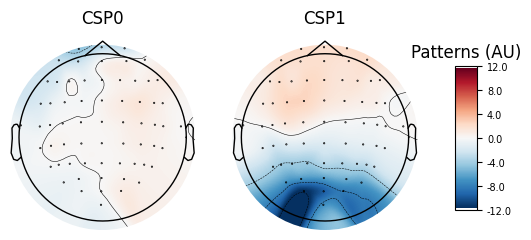

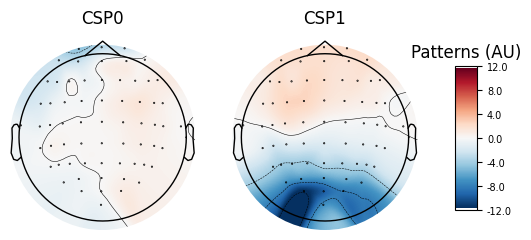

In [10]:
# Fitting and ploting the CSP filters to the data
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
from mne.decoding import CSP
csp = CSP(n_components=2, reg=None, log=True, norm_trace=False)
labels = epochs.events[:, -1] - 2
epochs_data = epochs.get_data()
csp.fit_transform(epochs_data, labels)
csp.plot_patterns(epochs.info, ch_type="eeg", units="Patterns (AU)", size=1.5)

**Part7: Classification between left and right hand movements**



In [11]:
# Define a monte-carlo cross-validation generator (reduce variance):
epochs_train = epochs.copy().crop(tmin=0, tmax=4)
scores = []
epochs_data = epochs.get_data()
epochs_data_train = epochs_train.get_data()
cv = ShuffleSplit(10, test_size=0.2, random_state=42)
cv_split = cv.split(epochs_data_train)

# Assemble a classifier
lda = LinearDiscriminantAnalysis()

# Use scikit-learn Pipeline with cross_val_score function
clf = Pipeline([("CSP", csp), ("LDA", lda)])
scores = cross_val_score(clf, epochs_data_train, labels, cv=cv, n_jobs=None)

# Printing the results
class_balance = np.mean(labels == labels[0])
class_balance = max(class_balance, 1.0 - class_balance)
print("Classification accuracy: %f / Chance level: %f" % (np.mean(scores), class_balance))

Computing rank from data with rank=None
    Using tolerance 0.00014 (2.2e-16 eps * 64 dim * 1e+10  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00013 (2.2e-16 eps * 64 dim * 9.1e+09  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00013 (2.2e-16 eps * 64 dim * 9.3e+09  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00014 (2.2e-16 eps * 64 dim * 9.9e+09  max singular value)
  

Computing rank from data with rank=None
    Using tolerance 0.00014 (2.2e-16 eps * 64 dim * 1e+10  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00013 (2.2e-16 eps * 64 dim * 9.1e+09  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00013 (2.2e-16 eps * 64 dim * 9.3e+09  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00014 (2.2e-16 eps * 64 dim * 9.9e+09  max singular value)
  

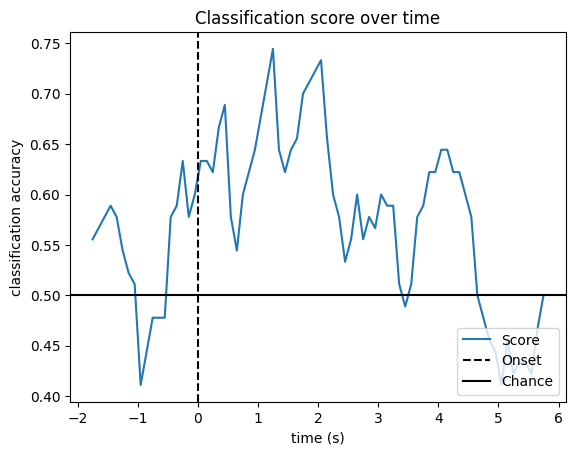

In [12]:
# Fitting and testing the classifier
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
sfreq = raw.info["sfreq"]
w_length = int(sfreq * 0.5)  # running classifier: window length
w_step = int(sfreq * 0.1)  # running classifier: window step size
w_start = np.arange(0, epochs_data.shape[2] - w_length, w_step)

scores_windows = []

for train_idx, test_idx in cv_split:
    y_train, y_test = labels[train_idx], labels[test_idx]

    X_train = csp.fit_transform(epochs_data_train[train_idx], y_train)
    X_test = csp.transform(epochs_data_train[test_idx])

    # fit classifier
    lda.fit(X_train, y_train)

    # running classifier: test classifier on sliding window
    score_this_window = []
    for n in w_start:
        X_test = csp.transform(epochs_data[test_idx][:, :, n : (n + w_length)])
        score_this_window.append(lda.score(X_test, y_test))
    scores_windows.append(score_this_window)

# Plot scores over time
w_times = (w_start + w_length / 2.0) / sfreq + epochs.tmin

plt.figure()
plt.plot(w_times, np.mean(scores_windows, 0), label="Score")
plt.axvline(0, linestyle="--", color="k", label="Onset")
plt.axhline(0.5, linestyle="-", color="k", label="Chance")
plt.xlabel("time (s)")
plt.ylabel("classification accuracy")
plt.title("Classification score over time")
plt.legend(loc="lower right")
plt.show()

**Try**

Use Beta band (13-30 Hz) instead of Mu for investigation

**Try**

Classify between either left or right motor imagery and rest state.

In [13]:
# Load the dataset, read data from subject 1, and combine all runs that include right and left hand imaginery movements, in addition to rest
# Exclude S088, S092, S100, since these subjects had damaged recordings, and too little samples (S104) in their left- and right-hand motor imagery datasets
from mne.datasets import eegbci
subject = 1
runs = [4, 8, 12]  # motor imagery: rest (T0) vs left hand (T1)
raw_fnames = eegbci.load_data(subject, runs)
raw = concatenate_raws([read_raw_edf(f, preload=True) for f in raw_fnames])
eegbci.standardize(raw)  # set channel names
montage = make_standard_montage("standard_1005")
raw.set_montage(montage)

Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<RawEDF | S001R04.edf, 64 x 60000 (375.0 s), ~29.4 MB, data loaded>

Filtering raw data in 3 contiguous segments
Setting up band-pass filter from 8 - 12 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 12.00 Hz
- Upper transition bandwidth: 3.00 Hz (-6 dB cutoff frequency: 13.50 Hz)
- Filter length: 265 samples (1.656 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


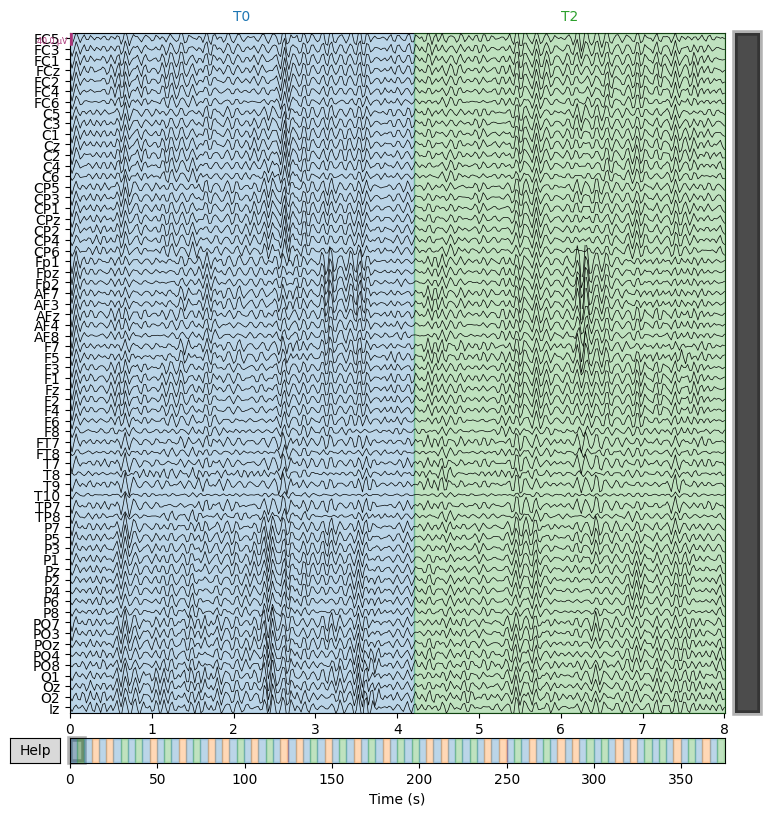

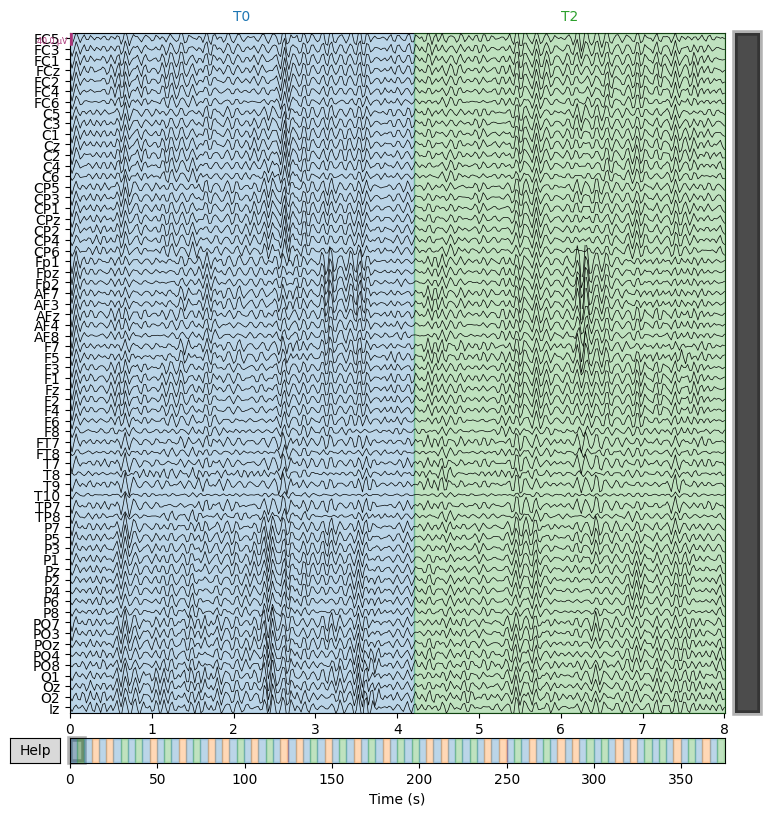

In [14]:
# Apply band-pass filter
# Frequency range chosen will be mu band (8-12 Hz)
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
raw.filter(8, 12, fir_design="firwin", skip_by_annotation="edge")
raw.plot(duration=8, n_channels=64)

In [15]:
# Read epochs
event_id = dict(rest=1, left_hand=2)
events, _ = events_from_annotations(raw, event_id=dict(T0=1, T1=2))
picks = pick_types(raw.info, meg=False, eeg=True, stim=False, eog=False, exclude="bads")
tmin, tmax = -2, 6
epochs = Epochs(raw, events, event_id, tmin, tmax, proj=False, picks=picks, baseline=(-2,-1), preload=True)

Used Annotations descriptions: ['T0', 'T1']
Not setting metadata
68 matching events found
Applying baseline correction (mode: mean)
Using data from preloaded Raw for 68 events and 1281 original time points ...
5 bad epochs dropped


Not setting metadata
42 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
42 matching events found
No baseline correction applied
0 projection items activated


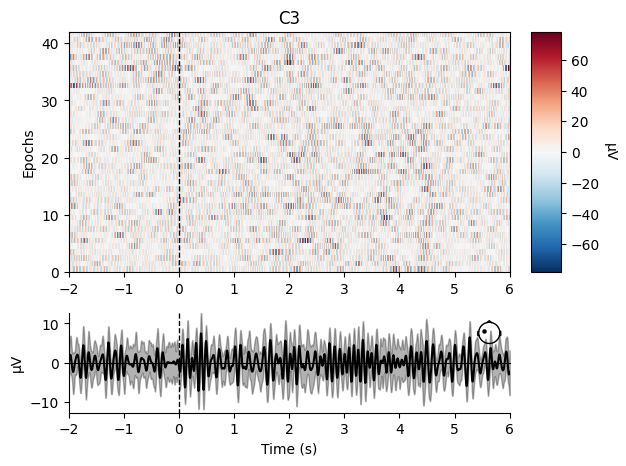

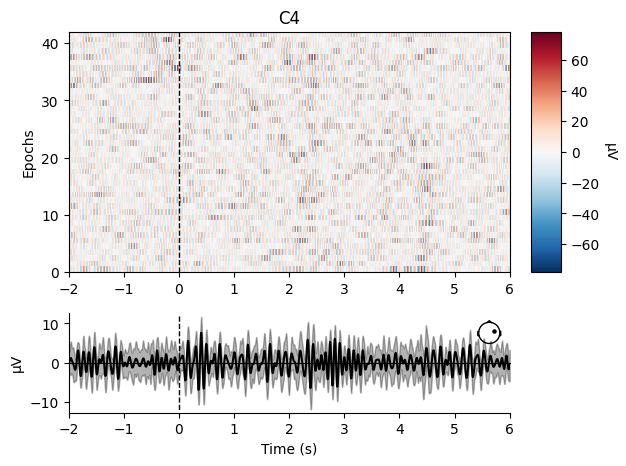

Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated


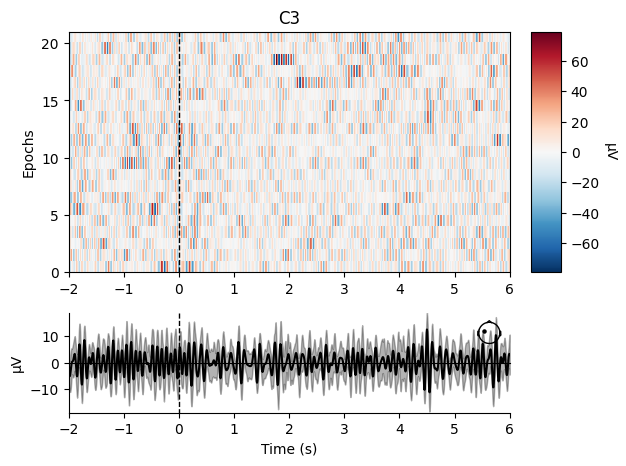

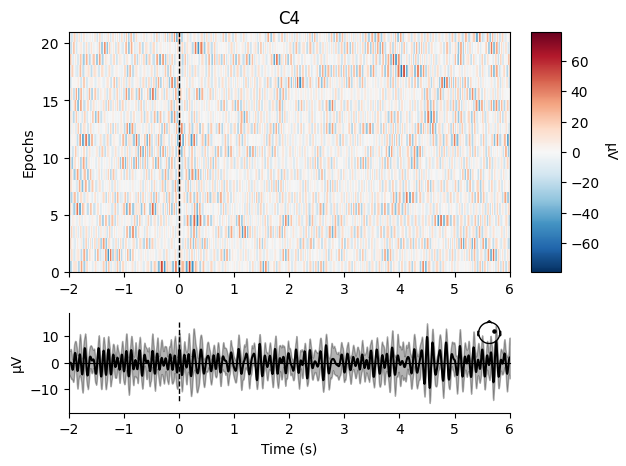

[<Figure size 640x480 with 4 Axes>, <Figure size 640x480 with 4 Axes>]

In [16]:
# Epochs separation
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
rest_hand_epochs = epochs['rest']
rest_hand_epochs.plot_image(picks=["C3", "C4"])
Left_hand_epochs = epochs['left_hand']
Left_hand_epochs.plot_image(picks=["C3", "C4"])

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "gfp"
combining channels using "gfp"


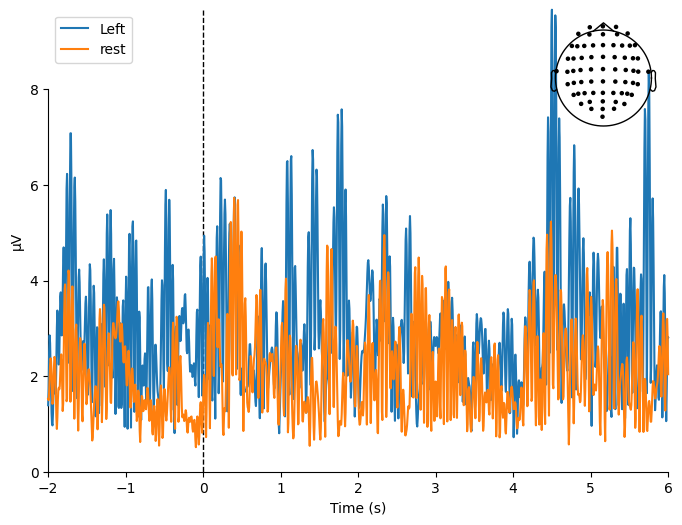

[<Figure size 800x600 with 2 Axes>]

In [17]:
# Averaging evoked responses
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
Left_hand_epochs_evoked = Left_hand_epochs.average()
rest_hand_epochs_evoked = rest_hand_epochs.average()
mne.viz.plot_compare_evokeds(dict(Left=Left_hand_epochs_evoked, rest=rest_hand_epochs_evoked), legend="upper left", show_sensors="upper right")

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows


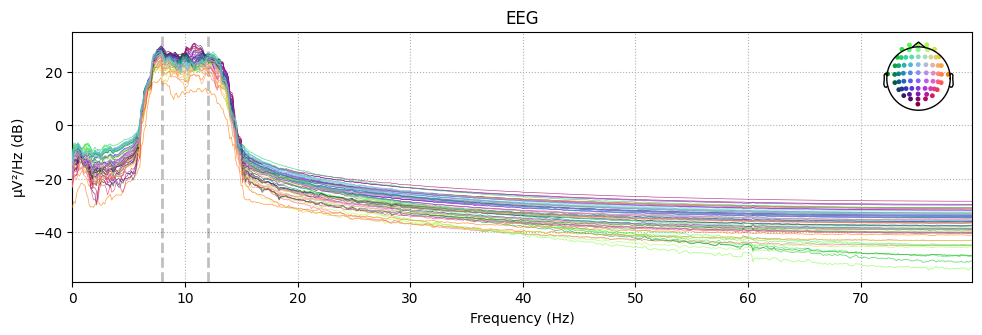

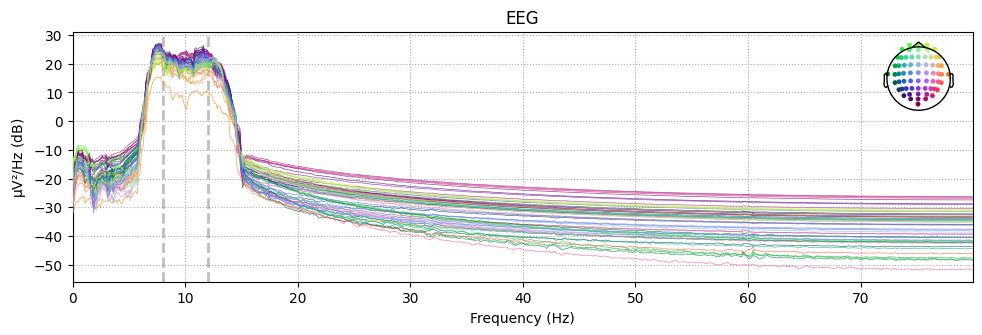

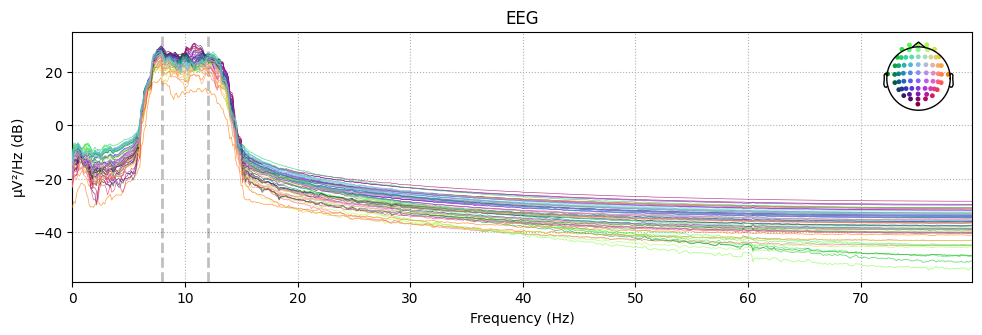

In [18]:
# Visualizing Spectrum objects
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
rest_hand_epochs_evoked_spectrum = rest_hand_epochs_evoked.compute_psd()
rest_hand_epochs_evoked_spectrum.plot()
Left_hand_epochs_evoked_spectrum = Left_hand_epochs_evoked.compute_psd()
Left_hand_epochs_evoked_spectrum.plot()

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.4s


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


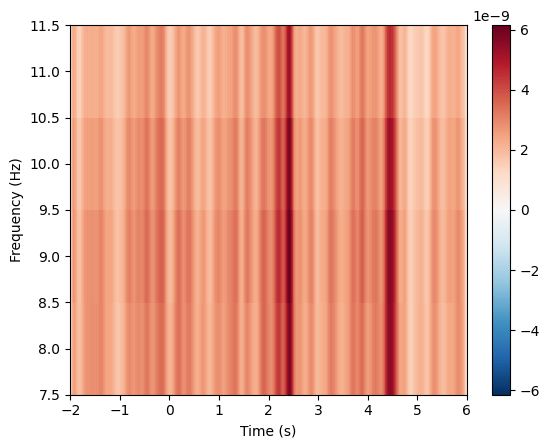

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


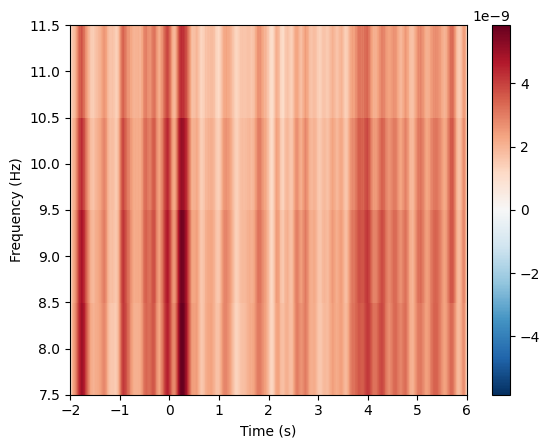

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.1s


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


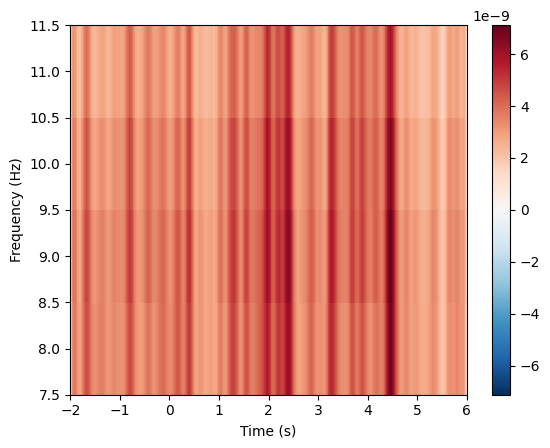

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


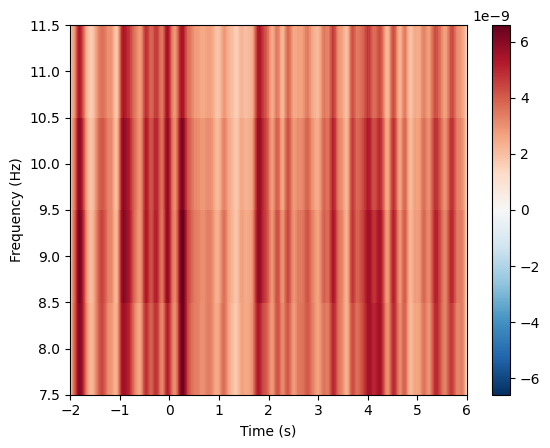

[<Figure size 640x480 with 2 Axes>]

In [19]:
#Time-frequency analysis
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
frequencies = np.arange(8, 12, 1)

power_restC4 = mne.time_frequency.tfr_morlet(rest_hand_epochs, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_restC4.plot(["C4"])
power_leftC4 = mne.time_frequency.tfr_morlet(Left_hand_epochs, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_leftC4.plot(["C4"])

power_restC3 = mne.time_frequency.tfr_morlet(rest_hand_epochs, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_restC3.plot(["C3"])
power_leftC3 = mne.time_frequency.tfr_morlet(Left_hand_epochs, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_leftC3.plot(["C3"])

Computing rank from data with rank=None
    Using tolerance 0.00031 (2.2e-16 eps * 64 dim * 2.2e+10  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00021 (2.2e-16 eps * 64 dim * 1.5e+10  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.


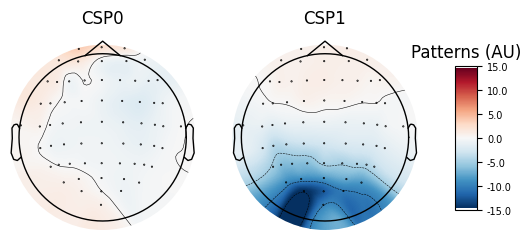

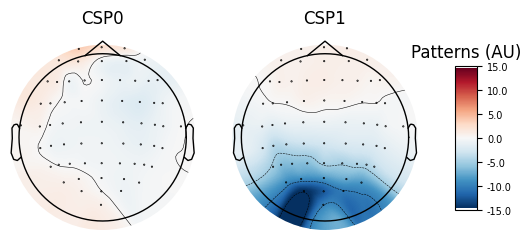

In [20]:
# Fitting and ploting the CSP filters to the data
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
from mne.decoding import CSP
csp = CSP(n_components=2, reg=None, log=True, norm_trace=False)
labels = epochs.events[:, -1] - 2
epochs_data = epochs.get_data()
csp.fit_transform(epochs_data, labels)
csp.plot_patterns(epochs.info, ch_type="eeg", units="Patterns (AU)", size=1.5)

In [21]:
# Define a monte-carlo cross-validation generator (reduce variance):
epochs_train = epochs.copy().crop(tmin=0, tmax=4)
scores = []
epochs_data = epochs.get_data()
epochs_data_train = epochs_train.get_data()
cv = ShuffleSplit(10, test_size=0.2, random_state=42)
cv_split = cv.split(epochs_data_train)

# Assemble a classifier
lda = LinearDiscriminantAnalysis()

# Use scikit-learn Pipeline with cross_val_score function
clf = Pipeline([("CSP", csp), ("LDA", lda)])
scores = cross_val_score(clf, epochs_data_train, labels, cv=cv, n_jobs=None)

# Printing the results
class_balance = np.mean(labels == labels[0])
class_balance = max(class_balance, 1.0 - class_balance)
print("Classification accuracy: %f / Chance level: %f" % (np.mean(scores), class_balance))

Computing rank from data with rank=None
    Using tolerance 0.0002 (2.2e-16 eps * 64 dim * 1.4e+10  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00013 (2.2e-16 eps * 64 dim * 9.5e+09  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00019 (2.2e-16 eps * 64 dim * 1.4e+10  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00014 (2.2e-16 eps * 64 dim * 9.6e+09  max singular value)
 

Computing rank from data with rank=None
    Using tolerance 0.0002 (2.2e-16 eps * 64 dim * 1.4e+10  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00013 (2.2e-16 eps * 64 dim * 9.5e+09  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00019 (2.2e-16 eps * 64 dim * 1.4e+10  max singular value)
    Estimated rank (mag): 64
    MAG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00014 (2.2e-16 eps * 64 dim * 9.6e+09  max singular value)
 

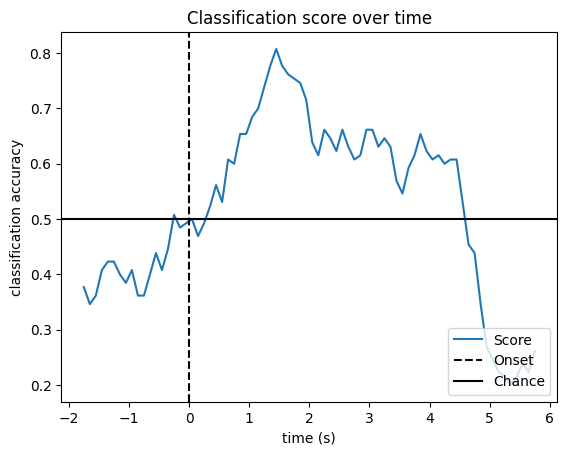

In [22]:
# Fitting and testing the classifier
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
sfreq = raw.info["sfreq"]
w_length = int(sfreq * 0.5)  # running classifier: window length
w_step = int(sfreq * 0.1)  # running classifier: window step size
w_start = np.arange(0, epochs_data.shape[2] - w_length, w_step)

scores_windows = []

for train_idx, test_idx in cv_split:
    y_train, y_test = labels[train_idx], labels[test_idx]

    X_train = csp.fit_transform(epochs_data_train[train_idx], y_train)
    X_test = csp.transform(epochs_data_train[test_idx])

    # fit classifier
    lda.fit(X_train, y_train)

    # running classifier: test classifier on sliding window
    score_this_window = []
    for n in w_start:
        X_test = csp.transform(epochs_data[test_idx][:, :, n : (n + w_length)])
        score_this_window.append(lda.score(X_test, y_test))
    scores_windows.append(score_this_window)

# Plot scores over time
w_times = (w_start + w_length / 2.0) / sfreq + epochs.tmin

plt.figure()
plt.plot(w_times, np.mean(scores_windows, 0), label="Score")
plt.axvline(0, linestyle="--", color="k", label="Onset")
plt.axhline(0.5, linestyle="-", color="k", label="Chance")
plt.xlabel("time (s)")
plt.ylabel("classification accuracy")
plt.title("Classification score over time")
plt.legend(loc="lower right")
plt.show()

**Try**

Classify between left, right motor imagery tasks and rest state.

**Bonus**

Classify between actual and imaginary hand movements, for example (left MI) and (left real).

In [23]:
# Load the dataset, read data from subject 1, and combine all runs that include right and left hand executive movements
# Exclude S088, S092, S100, since these subjects had damaged recordings, and too little samples (S104) in their left- and right-hand motor execution datasets
from mne.datasets import eegbci
subject = 1
runs_E = [3, 7, 11]  # Motor Execution: left hand (T1) vs right hand (T2)
raw_fnames_E = eegbci.load_data(subject, runs_E)
raw_E = concatenate_raws([read_raw_edf(f, preload=True) for f in raw_fnames_E])
eegbci.standardize(raw_E)  # set channel names
montage_E = make_standard_montage("standard_1005")
raw_E.set_montage(montage_E)

Download complete in 06s (7.4 MB)
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<RawEDF | S001R03.edf, 64 x 60000 (375.0 s), ~29.4 MB, data loaded>

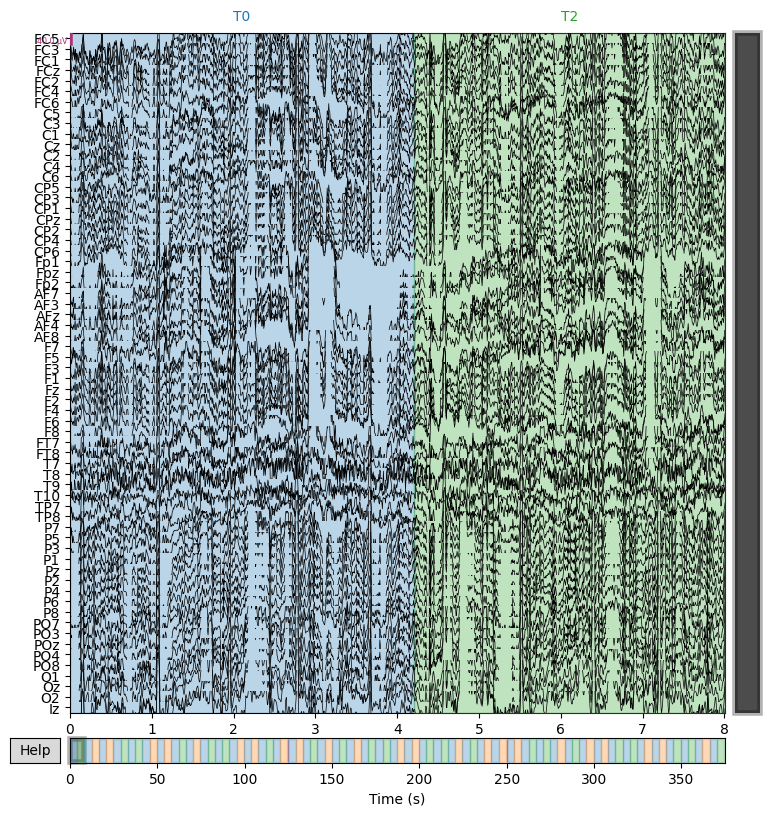

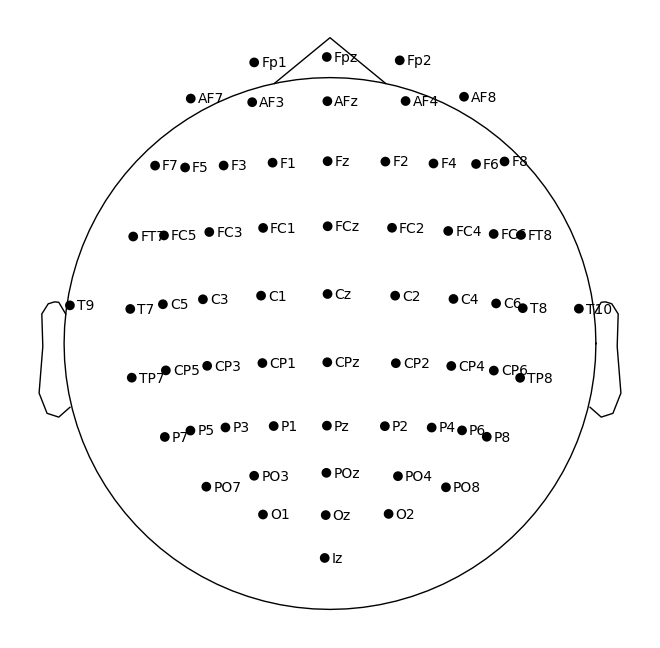

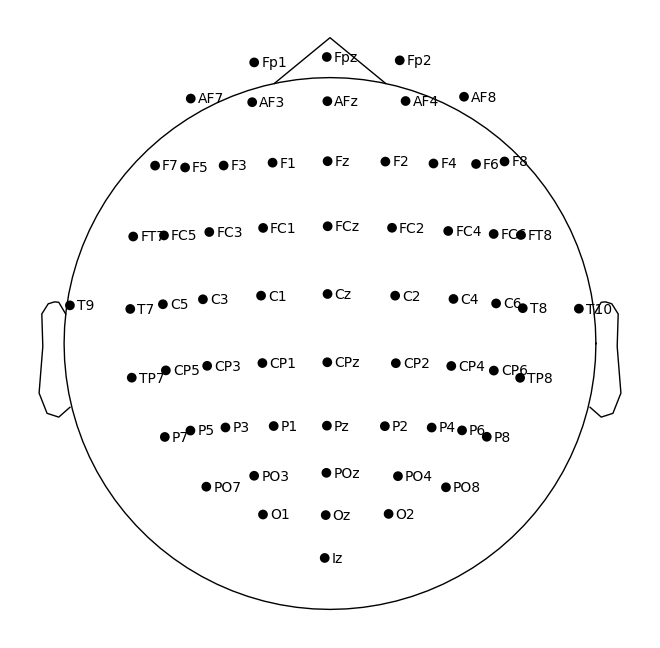

In [24]:
# Plot data and channel locations
# Frequency range chosen will cover both mu band (8-12 Hz)
raw_E.plot(duration=8, n_channels=64)
raw_E.plot_sensors(show_names=True)

Filtering raw data in 3 contiguous segments
Setting up band-pass filter from 8 - 12 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 12.00 Hz
- Upper transition bandwidth: 3.00 Hz (-6 dB cutoff frequency: 13.50 Hz)
- Filter length: 265 samples (1.656 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


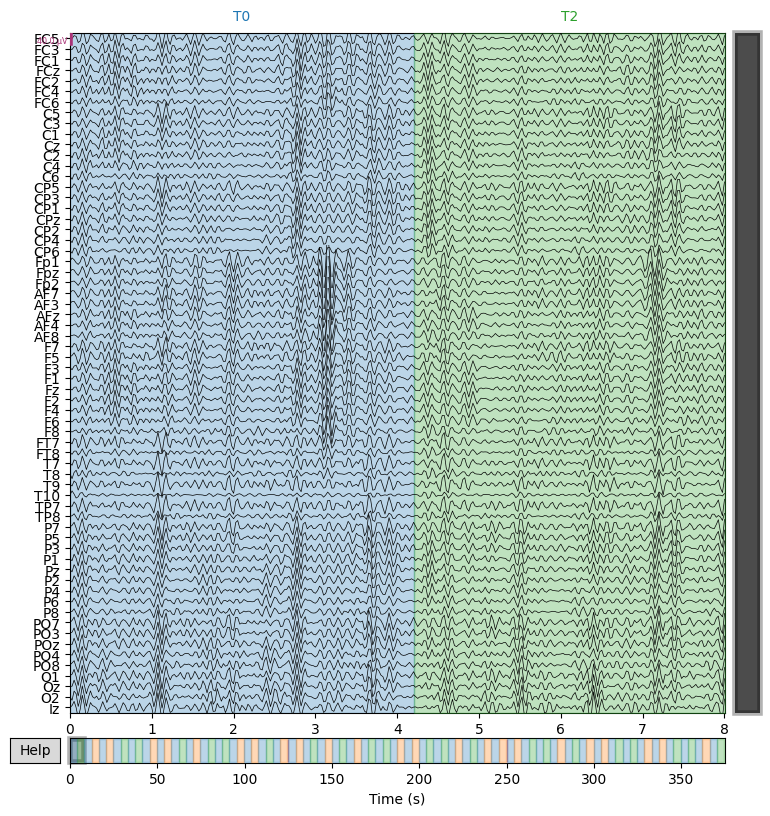

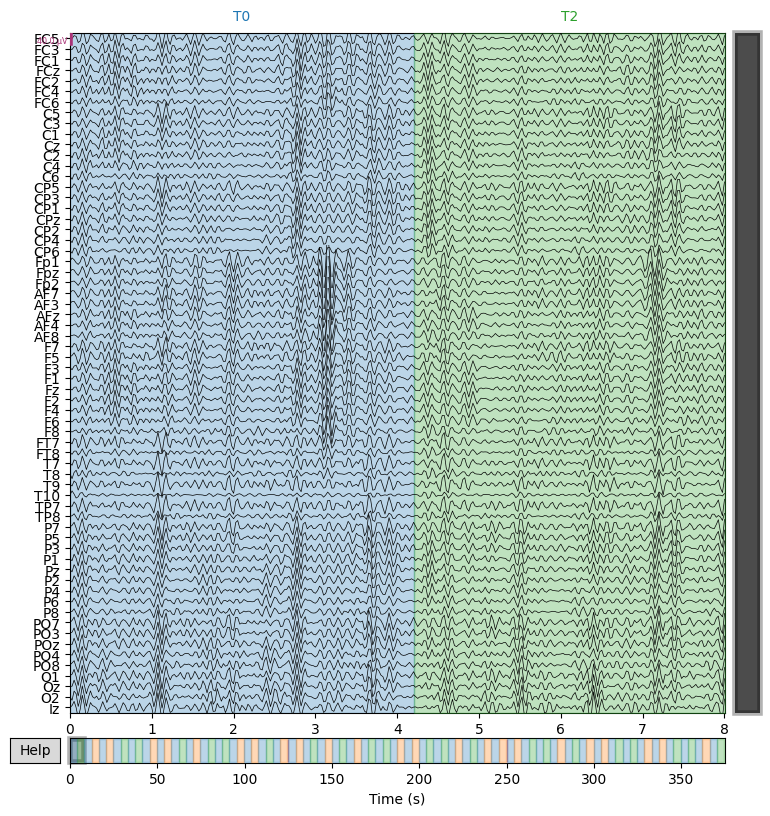

In [25]:
# Apply band-pass filter
raw_E.filter(8, 12, fir_design="firwin", skip_by_annotation="edge")
raw_E.plot(duration=8, n_channels=64)

In [26]:
# Read epochs
event_id = dict(left_hand_E=2, right_hand_E=3)
events_E, _ = events_from_annotations(raw_E, event_id=dict(T1=2,  T2=3))
picks_E = pick_types(raw_E.info, meg=False, eeg=True, stim=False, eog=False, exclude="bads")
tmin, tmax = -2, 6
epochs_E = Epochs(raw_E, events_E, event_id_E, tmin, tmax, proj=False, picks=picks_E, baseline=(-2,-1), preload=True)

Used Annotations descriptions: ['T1', 'T2']


NameError: ignored

In [ ]:
# Epochs separation
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
Left_hand_epochs_E = epochs_E['left_hand_E']
Left_hand_epochs_E.plot_image(picks=["C3", "C4"])
Right_hand_epochs_E = epochs_E['right_hand_E']
Right_hand_epochs_E.plot_image(picks=["C3", "C4"])

In [ ]:
# Averaging evoked responses
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
Left_hand_epochs_evoked_E = Left_hand_epochs_E.average()
Right_hand_epochs_evoked_E = Right_hand_epochs_E.average()
mne.viz.plot_compare_evokeds(dict(Left_E=Left_hand_epochs_evoked_E, Right_E=Right_hand_epochs_evoked_E), legend="upper left", show_sensors="upper right")

In [ ]:
# Visualizing Spectrum objects
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
Left_hand_epochs_evoked_spectrum_E = Left_hand_epochs_evoked_E.compute_psd()
Left_hand_epochs_evoked_spectrum_E.plot()
Right_hand_epochs_evoked_spectrum_E = Right_hand_epochs_evoked_E.compute_psd()
Right_hand_epochs_evoked_spectrum_E.plot()

In [ ]:
#Time-frequency analysis
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
frequencies = np.arange(8, 12, 1)

power_leftC4_E = mne.time_frequency.tfr_morlet(Left_hand_epochs_E, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_leftC4_E.plot(["C4"])
power_rightC4_E = mne.time_frequency.tfr_morlet(Right_hand_epochs_E, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_rightC4_E.plot(["C4"])

power_leftC3_E = mne.time_frequency.tfr_morlet(Left_hand_epochs_E, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_leftC3_E.plot(["C3"])
power_rightC3_E = mne.time_frequency.tfr_morlet(Right_hand_epochs_E, n_cycles=2, return_itc=False, freqs=frequencies, decim=1)
power_rightC3_E.plot(["C3"])

In [ ]:
# Fitting and ploting the CSP filters to the data
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
from mne.decoding import CSP
csp_E = CSP(n_components=2, reg=None, log=True, norm_trace=False)
labels_E = epochs_E.events[:, -1] - 2
epochs_data_E = epochs_E.get_data()
csp.fit_transform(epochs_data_E, labels_E)
csp.plot_patterns(epochs_E.info, ch_type="eeg", units="Patterns (AU)", size=1.5)

epochs_crop = epochs.copy().crop(tmin=0, tmax=4)
epochs_E_crop = epochs_E.copy().crop(tmin=0, tmax=4)
epochs_all_crop = np.concatenate((epochs_crop.get_data(),epochs_E_crop.get_data()),axis=0)

epochs_all = np.concatenate((epochs.get_data(),epochs_E.get_data()),axis=0)
labels_all = np.concatenate((labels,labels_E),axis=0)

In [ ]:
# Define a monte-carlo cross-validation generator (reduce variance):
scores_all = []
epochs_data_all = epochs_all
epochs_data_train_all = epochs_all_crop
cv = ShuffleSplit(10, test_size=0.2, random_state=42)
cv_split = cv.split(epochs_data_train_all)

# Assemble a classifier
lda = LinearDiscriminantAnalysis()

# Use scikit-learn Pipeline with cross_val_score function
clf = Pipeline([("CSP", csp), ("LDA", lda)])
scores_all = cross_val_score(clf, epochs_data_train_all, labels_all, cv=cv, n_jobs=None)

# Printing the results
class_balance_all = np.mean(labels_all == labels_all[0])
class_balance_all = max(class_balance_all, 1.0 - class_balance_all)
print("Classification accuracy: %f / Chance level: %f" % (np.mean(scores_all), class_balance_all))

In [ ]:
# Fitting and testing the classifier
# Discuss the plots with your colleagues, is that what you expected? if no, then why?
sfreq = raw.info["sfreq"]
w_length = int(sfreq * 0.5)  # running classifier: window length
w_step = int(sfreq * 0.1)  # running classifier: window step size
w_start = np.arange(0, epochs_data_all.shape[2] - w_length, w_step)

scores_windows_all = []

for train_idx, test_idx in cv_split:
    y_train_all, y_test_all = labels_all[train_idx], labels_all[test_idx]

    X_train_all = csp.fit_transform(epochs_data_train_all[train_idx], y_train_all)
    X_test_all = csp.transform(epochs_data_train_all[test_idx])

    # fit classifier
    lda.fit(X_train_all, y_train_all)

    # running classifier: test classifier on sliding window
    score_this_window_all = []
    for n in w_start:
        X_test_all = csp.transform(epochs_data_all[test_idx][:, :, n : (n + w_length)])
        score_this_window_all.append(lda.score(X_test_all, y_test_all))
    scores_windows_all.append(score_this_window_all)

# Plot scores over time
w_times = (w_start + w_length / 2.0) / sfreq + epochs.tmin
print(np.mean(scores_windows_all, 0).shape)
plt.figure()
plt.plot(w_times, np.mean(scores_windows_all, 0), label="Score")
plt.axvline(0, linestyle="--", color="k", label="Onset")
plt.axhline(0.5, linestyle="-", color="k", label="Chance")
plt.xlabel("time (s)")
plt.ylabel("classification accuracy")
plt.title("Classification score over time")
plt.legend(loc="lower right")
plt.show()

# Plot scores over time
w_times = (w_start + w_length / 2.0) / sfreq + epochs.tmin
print(np.mean(scores_windows_all, 0).shape)
plt.figure()
plt.plot(w_times, np.mean(scores_windows_all, 0), label="Score")
plt.axvline(0, linestyle="--", color="k", label="Onset")
plt.axhline(0.5, linestyle="-", color="k", label="Chance")
plt.xlabel("time (s)")
plt.ylabel("classification accuracy")
plt.title("Classification score over time")
plt.legend(loc="lower right")
plt.show()

**Think**

- What difference would the duration of the epoch have on the accurate detection of the MI pattern?

- Would it be better to use a combination of different features to classify the MI signals?

- Can the extensive vigilance load when recording MI affects the classification accuracy?

*Motor imagery classification dataset:*

Can you classify a 4-class motor imagery data?

chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://www.bbci.de/competition/iv/desc_2a.pdf


**References**
- Schalk, G., McFarland, D.J., Hinterberger, T., Birbaumer, N., Wolpaw, J.R. BCI2000: A General-Purpose Brain-Computer Interface (BCI) System. IEEE Transactions on Biomedical Engineering 51(6):1034-1043, 2004.
- Goldberger, A., Amaral, L., Glass, L., Hausdorff, J., Ivanov, P. C., Mark, R., ... & Stanley, H. E. (2000). PhysioBank, PhysioToolkit, and PhysioNet: Components of a new research resource for complex physiologic signals. Circulation [Online]. 101 (23), pp. e215–e220.
- Tang, Z., Li, C., & Sun, S. (2017). Single-trial EEG classification of motor imagery using deep convolutional neural networks. Optik, 130, 11-18.
- Jeon, Y., Nam, C. S., Kim, Y. J., & Whang, M. C. (2011). Event-related (De) synchronization (ERD/ERS) during motor imagery tasks: Implications for brain–computer interfaces. International Journal of Industrial Ergonomics, 41(5), 428-436.
- Wang, X., Hersche, M., Tömekce, B., Kaya, B., Magno, M., & Benini, L. (2020, June). An accurate eegnet-based motor-imagery brain–computer interface for low-power edge computing. In 2020 IEEE international symposium on medical measurements and applications (MeMeA) (pp. 1-6). IEEE.
- Zaky, M. H., Khedr, M. E., & Nasser, A. A. (2016, July). Effect of extensive training load on the classification accuracy for a three class motor imagery based brain-computer interface. In 2016 3rd International Conference on Advances in Computational Tools for Engineering Applications (ACTEA) (pp. 211-215). IEEE.

**Links for the used dataset:**
- https://physionet.org/content/eegmmidb/1.0.0/
- https://www.nmr.mgh.harvard.edu/mne/0.14/generated/mne.datasets.eegbci.load_data.html